In [4]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv("master_df.csv")
data

,gameId,startDate,homeTeam,awayTeam,homePitcher,awayPitcher,homeScore,awayScore,betmgm_opening_homeOdds,betmgm_opening_awayOdds,...,awayTeam_batting_avg,homePitcher_normalized,awayPitcher_normalized,game_year,homePitcher_era,awayPitcher_era,alpha,beta,gamma,X
0,259014,2022-05-21T00:10:00+00:00,Milwaukee,Washington,Eric Lauer,Erick Fedde,7,0,-190.0,155.0,...,0.249616,Eric Lauer,Erick Fedde,2022,2.16,4.08,1.972308,0.934555,1.888889,1
1,259007,2022-05-21T00:10:00+00:00,Houston,Texas,Cristian Javier,Martin Perez,0,3,-185.0,150.0,...,0.221405,Cristian Javier,Martin Perez,2022,2.87,1.64,1.318565,1.045509,0.571429,0
2,259026,2022-05-21T17:05:00+00:00,NY Yankees,Chi. White Sox,Nestor Cortes,Dallas Keuchel,7,5,-225.0,180.0,...,0.231073,Nestor Cortes,Dallas Keuchel,2022,1.35,5.54,1.474000,1.062145,4.103704,1
3,259023,2022-05-21T19:07:00+00:00,Toronto,Cincinnati,Alek Manoah,Hunter Greene,3,1,-250.0,200.0,...,0.218593,Alek Manoah,Hunter Greene,2022,1.71,6.21,1.861592,1.071855,3.631579,1
4,265633,2022-05-21T19:10:00+00:00,Colorado,NY Mets,German Marquez,Carlos Carrasco,1,5,-105.0,-115.0,...,0.252246,German Marquez,Carlos Carrasco,2022,6.16,3.73,0.747692,1.045761,0.605519,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2346,301021,2024-08-21T00:10:00+00:00,Kansas City,LA Angels,Cole Ragans,Tyler Anderson,5,9,-210.0,170.0,...,0.234300,Cole Ragans,Tyler Anderson,2024,5.92,3.40,1.296037,1.094678,0.574324,0
2347,301022,2024-08-21T00:10:00+00:00,Houston,Boston,Ronel Blanco,Nick Pivetta,5,6,-135.0,110.0,...,0.261592,Ronel Blanco,Nick Pivetta,2024,3.14,4.61,1.038168,0.998605,1.468153,0
2348,301034,2024-08-21T01:40:00+00:00,San Diego,Minnesota,Martin Perez,Bailey Ober,7,5,100.0,-120.0,...,0.251004,Martin Perez,Bailey Ober,2024,5.20,3.54,1.019784,1.056716,0.680769,1
2349,301025,2024-08-21T01:45:00+00:00,San Francisco,Chi. White Sox,Robbie Ray,Davis Martin,4,1,-250.0,200.0,...,0.219851,Robbie Ray,Davis Martin,2024,3.71,3.22,2.152542,1.106113,0.867925,1


📅 Plotting year: 2022


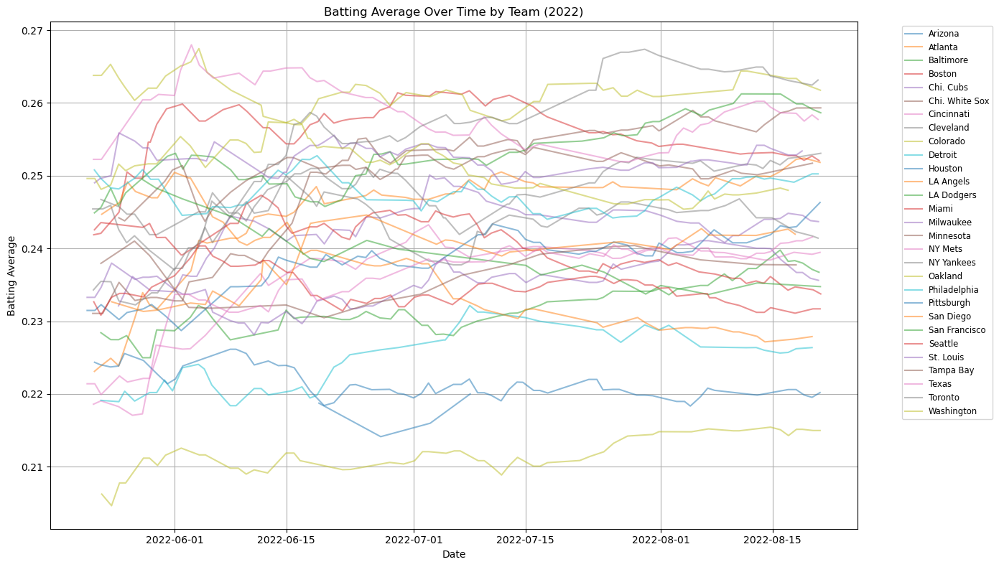

📅 Plotting year: 2023


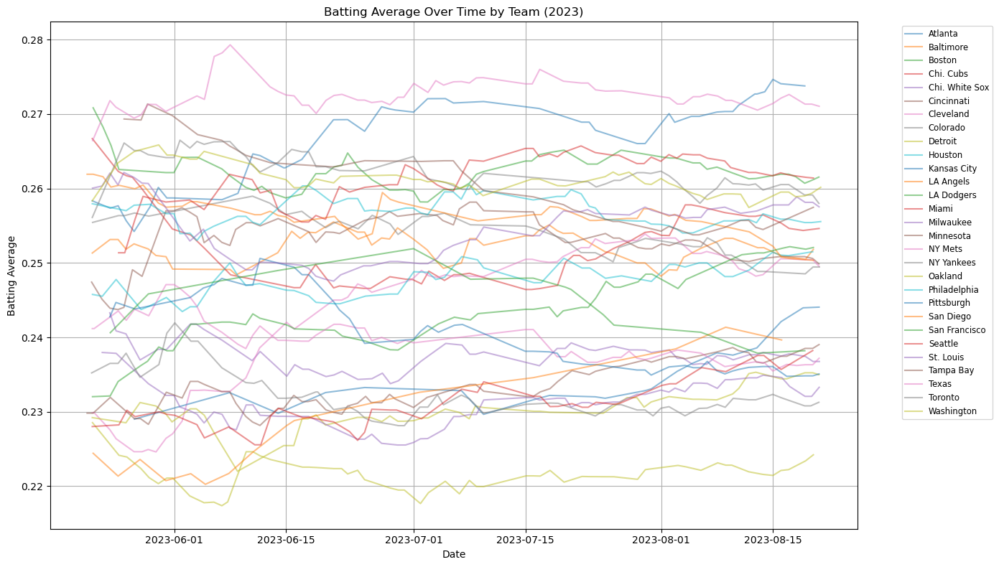

📅 Plotting year: 2024


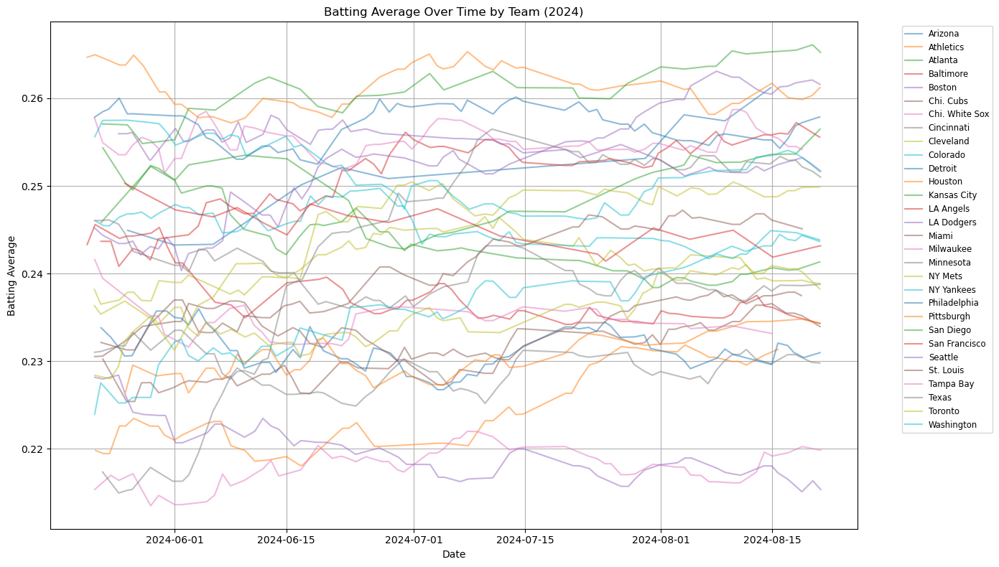

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Load and parse
data = pd.read_csv("master_df.csv")
data['startDate'] = pd.to_datetime(data['startDate'])
data['year'] = data['startDate'].dt.year

# Years to plot
years_to_plot = [2022, 2023, 2024]

for year in years_to_plot:
    print(f"📅 Plotting year: {year}")
    
    # Filter for this year
    year_data = data[data['year'] == year]

    # Prepare home and away batting averages
    home = year_data[['startDate', 'homeTeam', 'homeTeam_batting_avg']].rename(
        columns={'homeTeam': 'team', 'homeTeam_batting_avg': 'batting_avg'}
    )
    away = year_data[['startDate', 'awayTeam', 'awayTeam_batting_avg']].rename(
        columns={'awayTeam': 'team', 'awayTeam_batting_avg': 'batting_avg'}
    )

    long_df = pd.concat([home, away], ignore_index=True).dropna(subset=['batting_avg'])

    # Plot
    plt.figure(figsize=(14, 8))
    for team, group in long_df.groupby("team"):
        group = group.sort_values("startDate")
        plt.plot(group['startDate'], group['batting_avg'], label=team, alpha=0.5)

    plt.title(f"Batting Average Over Time by Team ({year})")
    plt.xlabel("Date")
    plt.ylabel("Batting Average")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    plt.tight_layout()
    plt.grid(True)
    plt.show()


📅 Plotting year: 2022


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_76317/3653336968.py:35: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)


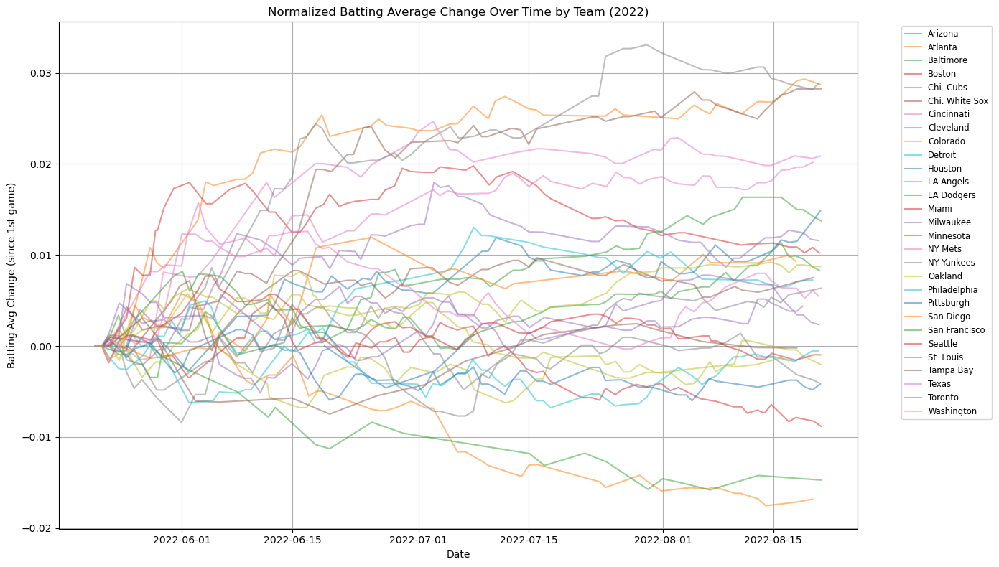

📅 Plotting year: 2023


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_76317/3653336968.py:35: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)


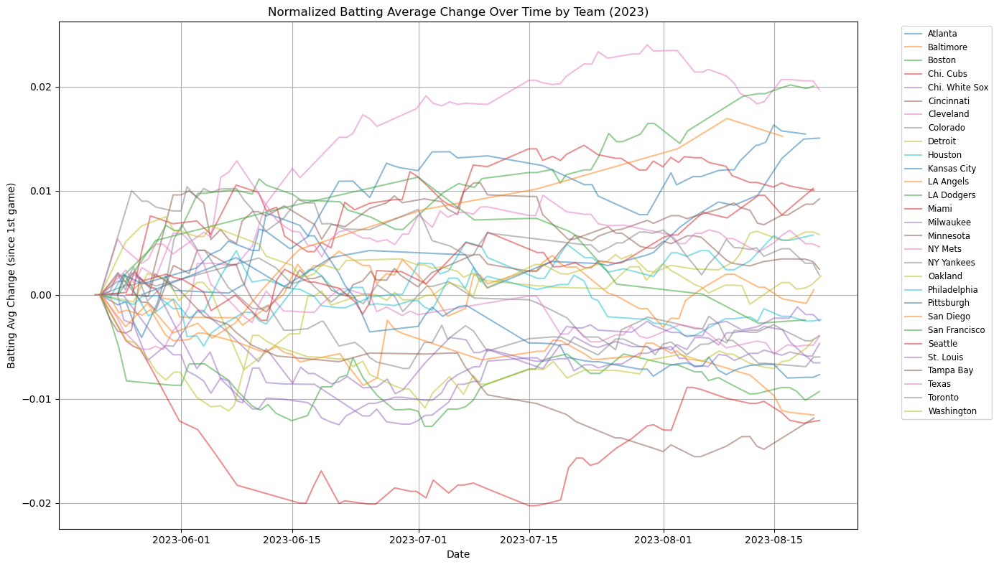

📅 Plotting year: 2024


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_76317/3653336968.py:35: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)


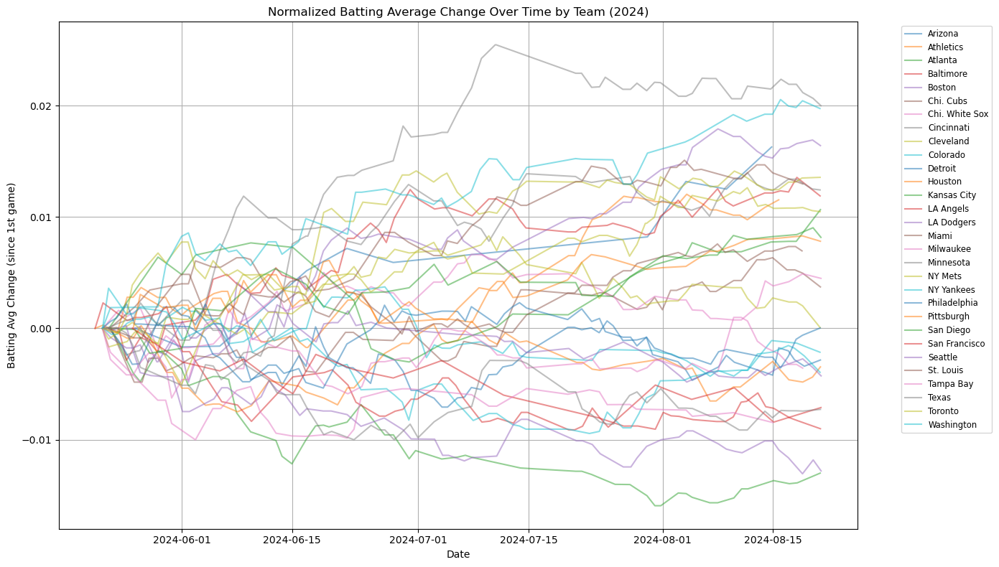

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Load and parse
data = pd.read_csv("master_df.csv")
data['startDate'] = pd.to_datetime(data['startDate'])
data['year'] = data['startDate'].dt.year

# Years to plot
years_to_plot = [2022, 2023, 2024]

for year in years_to_plot:
    print(f"📅 Plotting year: {year}")
    
    # Filter for this year
    year_data = data[data['year'] == year]

    # Prepare home and away batting averages
    home = year_data[['startDate', 'homeTeam', 'homeTeam_batting_avg']].rename(
        columns={'homeTeam': 'team', 'homeTeam_batting_avg': 'batting_avg'}
    )
    away = year_data[['startDate', 'awayTeam', 'awayTeam_batting_avg']].rename(
        columns={'awayTeam': 'team', 'awayTeam_batting_avg': 'batting_avg'}
    )

    long_df = pd.concat([home, away], ignore_index=True).dropna(subset=['batting_avg'])

    # Normalize batting_avg by team's first game of the year
    def normalize(group):
        group = group.sort_values("startDate")
        baseline = group['batting_avg'].iloc[0]
        group['batting_avg'] = group['batting_avg'] - baseline
        return group

    normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)

    # Plot
    plt.figure(figsize=(14, 8))
    for team, group in normalized_df.groupby("team"):
        plt.plot(group['startDate'], group['batting_avg'], label=team, alpha=0.5)

    plt.title(f"Normalized Batting Average Change Over Time by Team ({year})")
    plt.xlabel("Date")
    plt.ylabel("Batting Avg Change (since 1st game)")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    plt.tight_layout()
    plt.grid(True)
    plt.show()


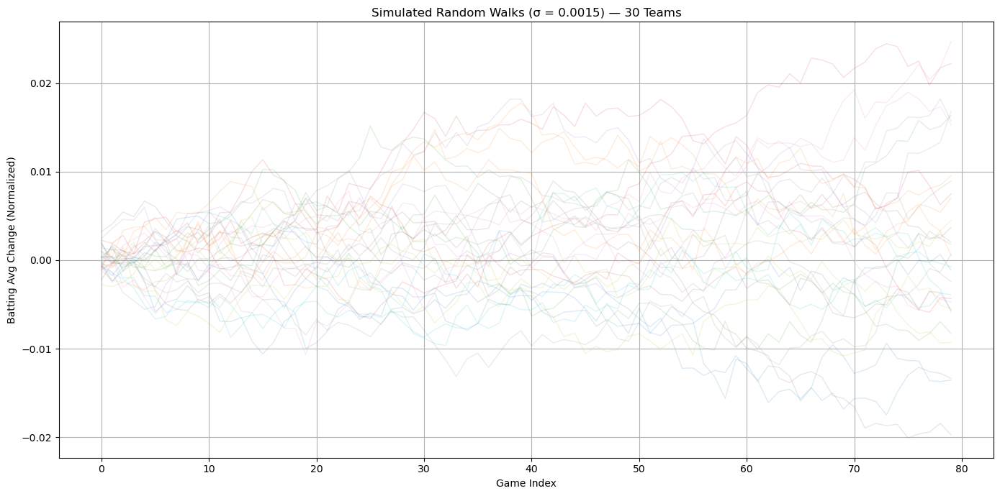

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
n_teams = 30
n_games = 80
step_std = 0.0015

# Simulate 300 random walks
walks = np.cumsum(np.random.normal(0, step_std, size=(n_teams, n_games)), axis=1)

# Plot
plt.figure(figsize=(14, 7))
for i in range(n_teams):
    plt.plot(walks[i], alpha=0.15, linewidth=1)

plt.title(f"Simulated Random Walks (σ = {step_std}) — {n_teams} Teams")
plt.xlabel("Game Index")
plt.ylabel("Batting Avg Change (Normalized)")
plt.grid(True)
plt.tight_layout()
plt.show()


📅 Plotting year: 2022


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_77654/2401741459.py:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)
/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_77654/2401741459.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap("viridis")  # or "plasma", "coolwarm", etc.


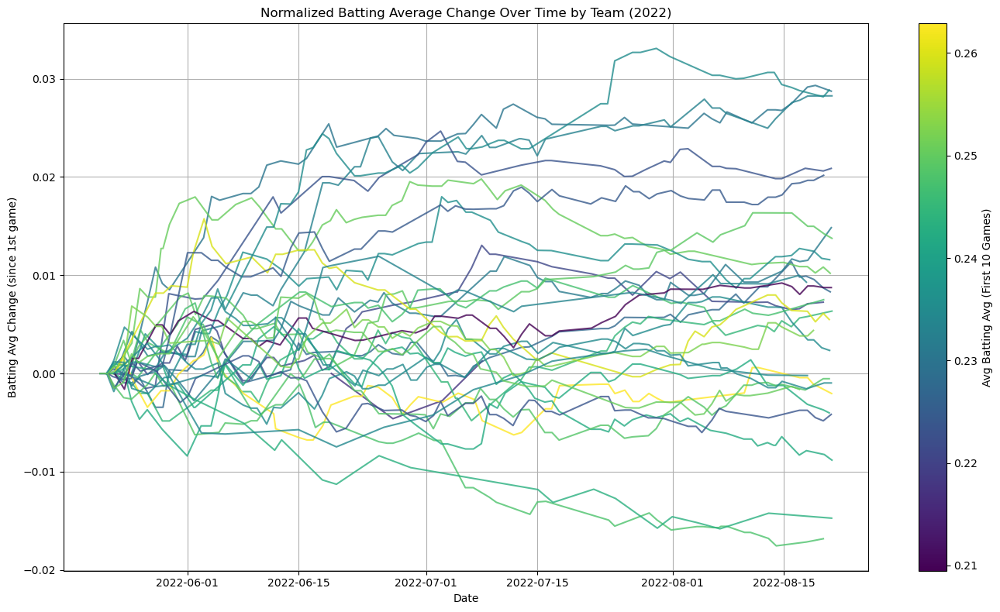

/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_77654/2401741459.py:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)
/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_77654/2401741459.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap("viridis")  # or "plasma", "coolwarm", etc.


📅 Plotting year: 2023


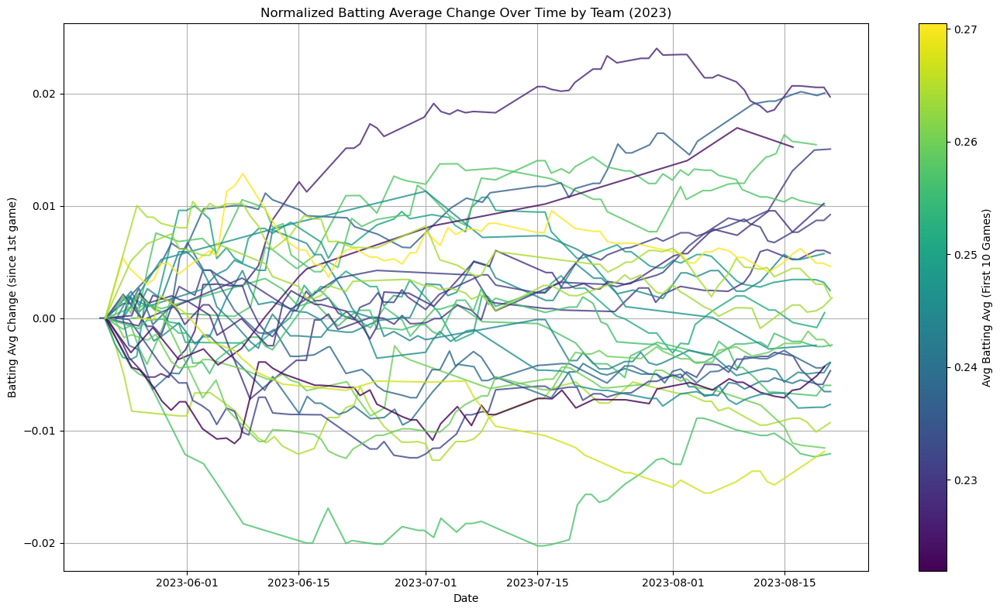

📅 Plotting year: 2024


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_77654/2401741459.py:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)
/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_77654/2401741459.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap("viridis")  # or "plasma", "coolwarm", etc.


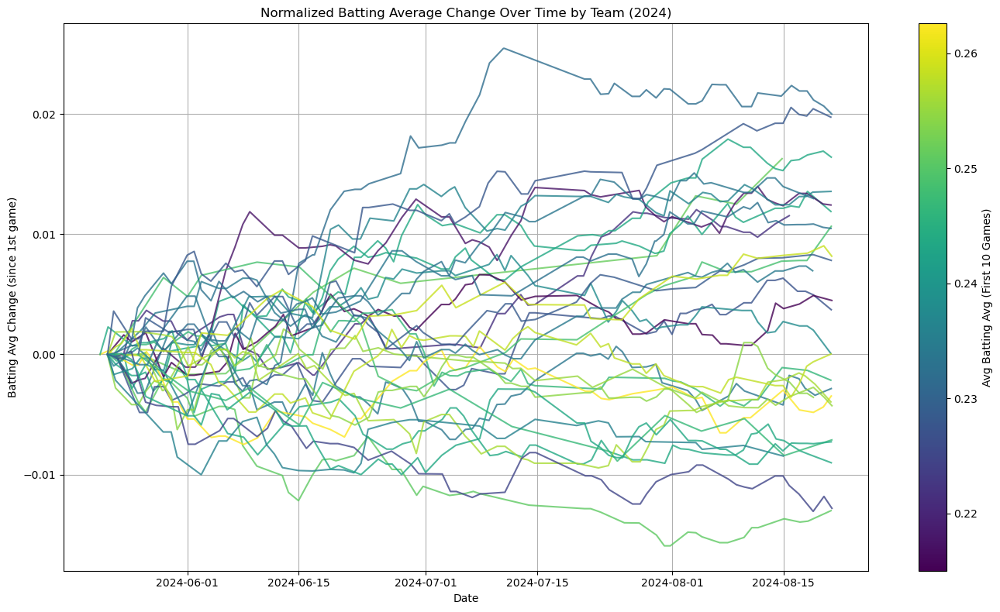

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Load and parse
data = pd.read_csv("master_df.csv")
data['startDate'] = pd.to_datetime(data['startDate'])
data['year'] = data['startDate'].dt.year

# Years to plot
years_to_plot = [2022, 2023, 2024]

for year in years_to_plot:
    print(f"📅 Plotting year: {year}")
    
    year_data = data[data['year'] == year]

    # Prepare home and away batting averages
    home = year_data[['startDate', 'homeTeam', 'homeTeam_batting_avg']].rename(
        columns={'homeTeam': 'team', 'homeTeam_batting_avg': 'batting_avg'}
    )
    away = year_data[['startDate', 'awayTeam', 'awayTeam_batting_avg']].rename(
        columns={'awayTeam': 'team', 'awayTeam_batting_avg': 'batting_avg'}
    )

    long_df = pd.concat([home, away], ignore_index=True).dropna(subset=['batting_avg'])

    # Normalize each team by their first game
    def normalize(group):
        group = group.sort_values("startDate")
        baseline = group['batting_avg'].iloc[0]
        group['batting_avg'] = group['batting_avg'] - baseline
        return group

    normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)

    # Compute early-season mean for color mapping (first 10 games)
    early_means = (
        long_df.sort_values("startDate")
        .groupby("team")
        .head(10)
        .groupby("team")["batting_avg"]
        .mean()
    )

    # Normalize early means to colormap scale
    norm = mcolors.Normalize(vmin=early_means.min(), vmax=early_means.max())
    colormap = cm.get_cmap("viridis")  # or "plasma", "coolwarm", etc.

    # Plot
    plt.figure(figsize=(14, 8))
    for team, group in normalized_df.groupby("team"):
        avg_val = early_means.get(team, 0.3)  # fallback avg
        color = colormap(norm(avg_val))
        plt.plot(group['startDate'], group['batting_avg'], color=color, alpha=0.8)

    sm = cm.ScalarMappable(cmap=colormap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=plt.gca())
    cbar.set_label("Avg Batting Avg (First 10 Games)")

    plt.title(f"Normalized Batting Average Change Over Time by Team ({year})")
    plt.xlabel("Date")
    plt.ylabel("Batting Avg Change (since 1st game)")
    plt.tight_layout()
    plt.grid(True)
    plt.show()


In [9]:
import pandas as pd

# Load and parse
data = pd.read_csv("master_df.csv")
data['startDate'] = pd.to_datetime(data['startDate'])
data['year'] = data['startDate'].dt.year

# Choose year
year = 2022  # adjust as needed
year_data = data[data['year'] == year]

# Combine home/away batting averages
home = year_data[['startDate', 'homeTeam', 'homeTeam_batting_avg']].rename(
    columns={'homeTeam': 'team', 'homeTeam_batting_avg': 'batting_avg'}
)
away = year_data[['startDate', 'awayTeam', 'awayTeam_batting_avg']].rename(
    columns={'awayTeam': 'team', 'awayTeam_batting_avg': 'batting_avg'}
)

long_df = pd.concat([home, away], ignore_index=True).dropna(subset=['batting_avg'])

# Get early-season average (first 10 games per team)
early_means = (
    long_df.sort_values("startDate")
    .groupby("team")
    .head(10)
    .groupby("team")["batting_avg"]
    .mean()
)

# Assign teams to terciles
quantiles = early_means.quantile([1/3, 2/3])
def assign_group(avg):
    if avg <= quantiles.iloc[0]:
        return 'low'
    elif avg <= quantiles.iloc[1]:
        return 'medium'
    else:
        return 'high'

group_map = early_means.apply(assign_group)

# Normalize batting_avg per team
def normalize(group):
    group = group.sort_values("startDate")
    baseline = group['batting_avg'].iloc[0]
    group['batting_avg'] = group['batting_avg'] - baseline
    return group

normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)
normalized_df['tier'] = normalized_df['team'].map(group_map)

# Calculate step std per tier
for tier in ['low', 'medium', 'high']:
    tier_diffs = []
    for _, group in normalized_df[normalized_df['tier'] == tier].groupby('team'):
        diff = group.sort_values('startDate')['batting_avg'].diff().dropna()
        tier_diffs.append(diff)
    all_diffs = pd.concat(tier_diffs)
    tier_std = all_diffs.std()
    print(f"{tier.capitalize()} tier σ: {tier_std:.5f}")


Low tier σ: 0.00148
Medium tier σ: 0.00150
High tier σ: 0.00138


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_77654/724383195.py:50: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)


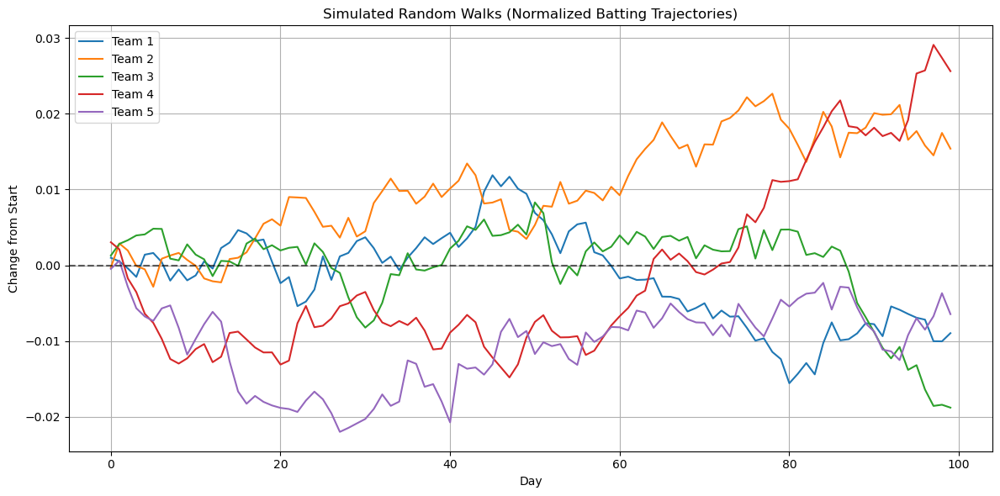

In [4]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(42)

n_teams = 5
n_days = 100

# Simulate step-wise changes (normal distribution, small variance)
steps = np.random.normal(loc=0, scale=0.002, size=(n_days, n_teams))

# Cumulative sum = random walk
walks = np.cumsum(steps, axis=0)

plt.figure(figsize=(12, 6))
for i in range(n_teams):
    plt.plot(walks[:, i], label=f"Team {i+1}")

plt.axhline(0, color="black", linestyle="--", alpha=0.6)
plt.title("Simulated Random Walks (Normalized Batting Trajectories)")
plt.xlabel("Day")
plt.ylabel("Change from Start")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


PITCHING

📅 Plotting year: 2022


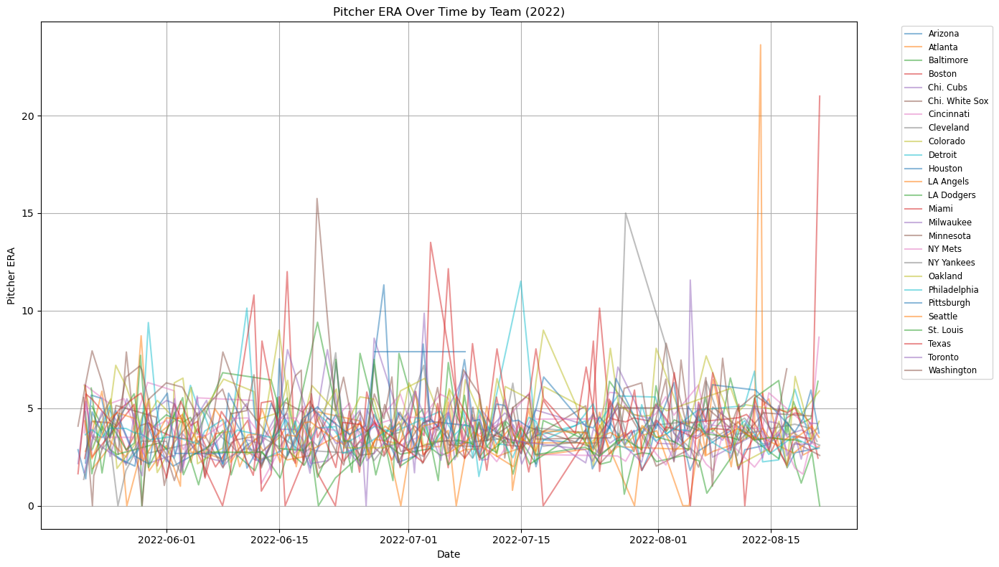

📅 Plotting year: 2023


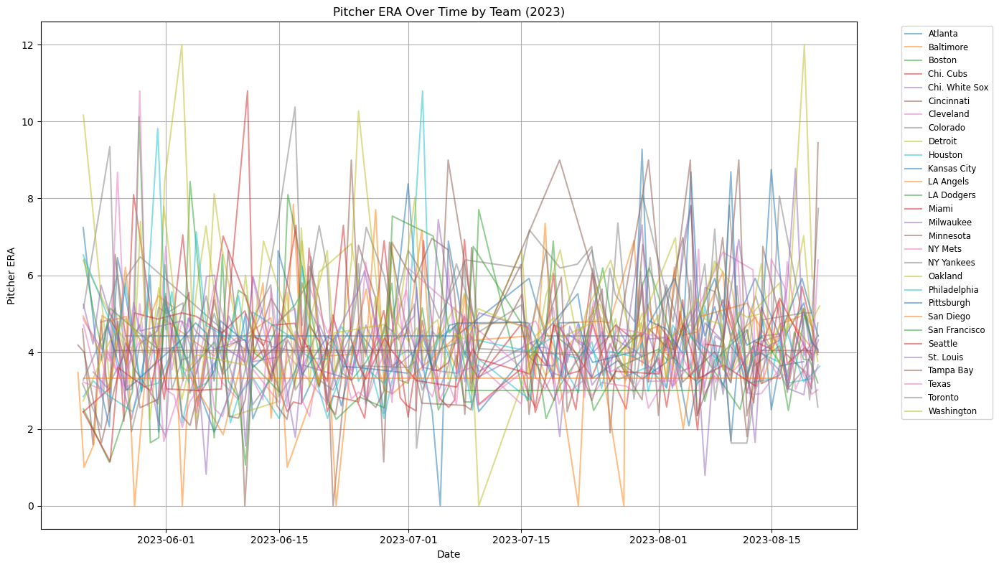

📅 Plotting year: 2024


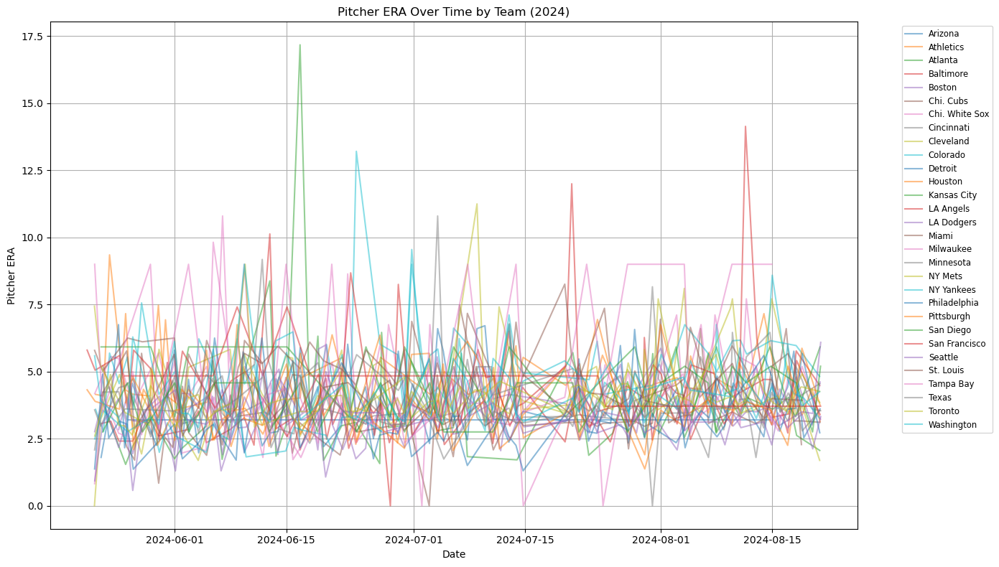

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Load and parse
data = pd.read_csv("master_df.csv")
data['startDate'] = pd.to_datetime(data['startDate'])
data['year'] = data['startDate'].dt.year

# Years to plot
years_to_plot = [2022, 2023, 2024]

for year in years_to_plot:
    print(f"📅 Plotting year: {year}")
    
    # Filter for this year
    year_data = data[data['year'] == year]

    # Prepare home and away batting averages
    home = year_data[['startDate', 'homeTeam', 'homePitcher_era']].rename(
        columns={'homeTeam': 'team', 'homePitcher_era': 'pitch_era'}
    )
    away = year_data[['startDate', 'awayTeam', 'awayPitcher_era']].rename(
        columns={'awayTeam': 'team', 'awayPitcher_era': 'pitch_era'}
    )

    long_df = pd.concat([home, away], ignore_index=True).dropna(subset=['pitch_era'])

    # Plot
    plt.figure(figsize=(14, 8))
    for team, group in long_df.groupby("team"):
        group = group.sort_values("startDate")
        plt.plot(group['startDate'], group['pitch_era'], label=team, alpha=0.5)

    plt.title(f"Pitcher ERA Over Time by Team ({year})")
    plt.xlabel("Date")
    plt.ylabel("Pitcher ERA")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    plt.tight_layout()
    plt.grid(True)
    plt.show()

📅 Plotting year: 2022


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_76317/83093023.py:35: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)


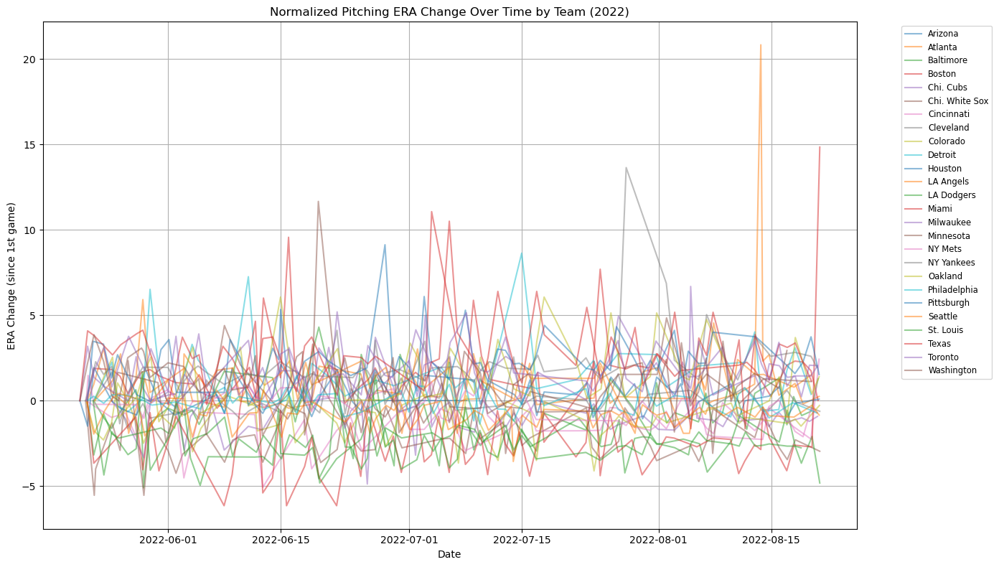

📅 Plotting year: 2023


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_76317/83093023.py:35: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)


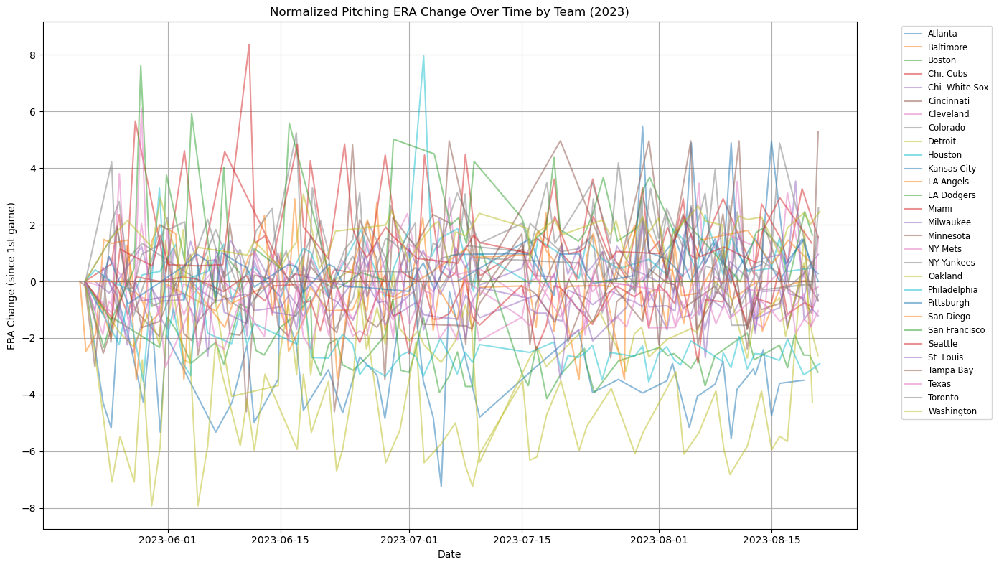

📅 Plotting year: 2024


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_76317/83093023.py:35: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)


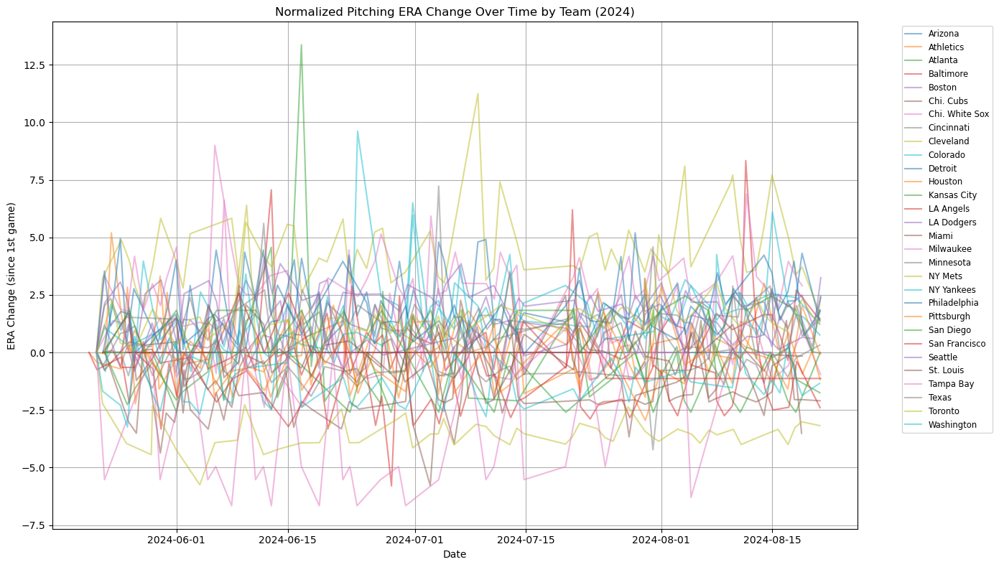

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Load and parse
data = pd.read_csv("master_df.csv")
data['startDate'] = pd.to_datetime(data['startDate'])
data['year'] = data['startDate'].dt.year

# Years to plot
years_to_plot = [2022, 2023, 2024]

for year in years_to_plot:
    print(f"📅 Plotting year: {year}")
    
    # Filter for this year
    year_data = data[data['year'] == year]

    # Prepare home and away pitching ERA
    home = year_data[['startDate', 'homeTeam', 'homePitcher_era']].rename(
        columns={'homeTeam': 'team', 'homePitcher_era': 'pitch_era'}
    )
    away = year_data[['startDate', 'awayTeam', 'awayPitcher_era']].rename(
        columns={'awayTeam': 'team', 'awayPitcher_era': 'pitch_era'}
    )

    long_df = pd.concat([home, away], ignore_index=True).dropna(subset=['pitch_era'])

    # Normalize each team's ERA by its first appearance
    def normalize(group):
        group = group.sort_values("startDate")
        baseline = group['pitch_era'].iloc[0]
        group['pitch_era'] = group['pitch_era'] - baseline
        return group

    normalized_df = long_df.groupby("team", group_keys=False).apply(normalize)

    # Plot
    plt.figure(figsize=(14, 8))
    for team, group in normalized_df.groupby("team"):
        plt.plot(group['startDate'], group['pitch_era'], label=team, alpha=0.5)

    plt.title(f"Normalized Pitching ERA Change Over Time by Team ({year})")
    plt.xlabel("Date")
    plt.ylabel("ERA Change (since 1st game)")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    plt.tight_layout()
    plt.grid(True)
    plt.show()


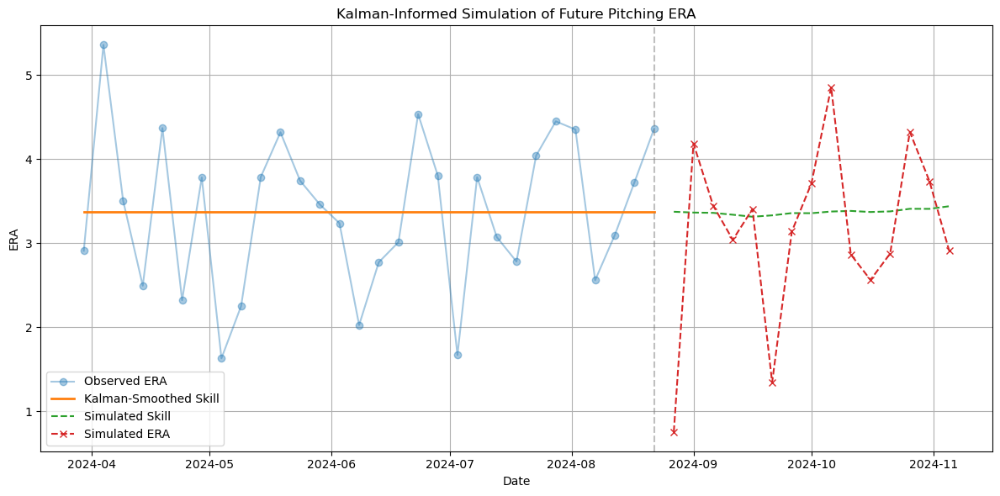

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.structural import UnobservedComponents

# 🔢 Example: Team pitching ERA over time (mocked or from real data)
np.random.seed(42)
dates = pd.date_range(start="2024-03-30", periods=30, freq="5D")
true_skill = np.cumsum(np.random.normal(loc=0.0, scale=0.02, size=len(dates))) + 3.5
observed_era = true_skill + np.random.normal(0, 1.0, len(dates))  # noisy per-game ERA

# Create DataFrame
df = pd.DataFrame({
    "date": dates,
    "observed_era": observed_era
})

# 🔍 Apply Kalman filter to learn latent pitching skill (local level model)
model = UnobservedComponents(df['observed_era'], level='local level')
result = model.fit(disp=False)
df['smoothed_skill'] = result.level.smoothed

# 🔮 Simulate future games (e.g., 15 games)
n_future = 15
future_dates = pd.date_range(start=dates[-1] + pd.Timedelta(days=5), periods=n_future, freq="5D")

# Simulate from last known skill value
simulated_skills = [df['smoothed_skill'].iloc[-1]]
for _ in range(n_future - 1):
    next_skill = simulated_skills[-1] + np.random.normal(0, 0.02)  # small drift
    simulated_skills.append(next_skill)

# Simulate noisy ERA outcomes
simulated_era = [s + np.random.normal(0, 1.0) for s in simulated_skills]

# Combine into a DataFrame
df_future = pd.DataFrame({
    "date": future_dates,
    "simulated_skill": simulated_skills,
    "simulated_era": simulated_era
})

# 📊 Plot actual, smoothed, and simulated
plt.figure(figsize=(12, 6))
plt.plot(df['date'], df['observed_era'], label="Observed ERA", alpha=0.4, marker='o')
plt.plot(df['date'], df['smoothed_skill'], label="Kalman-Smoothed Skill", linewidth=2)
plt.plot(df_future['date'], df_future['simulated_skill'], label="Simulated Skill", linestyle='--')
plt.plot(df_future['date'], df_future['simulated_era'], label="Simulated ERA", linestyle='--', marker='x')

plt.axvline(df['date'].iloc[-1], color='gray', linestyle='--', alpha=0.5)
plt.title("Kalman-Informed Simulation of Future Pitching ERA")
plt.xlabel("Date")
plt.ylabel("ERA")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_79330/3088512410.py:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  consecutive_counts = df.groupby('team').apply(max_consecutive_valid).reset_index()
Fitting Kalman models:   0%|          | 0/29 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/p

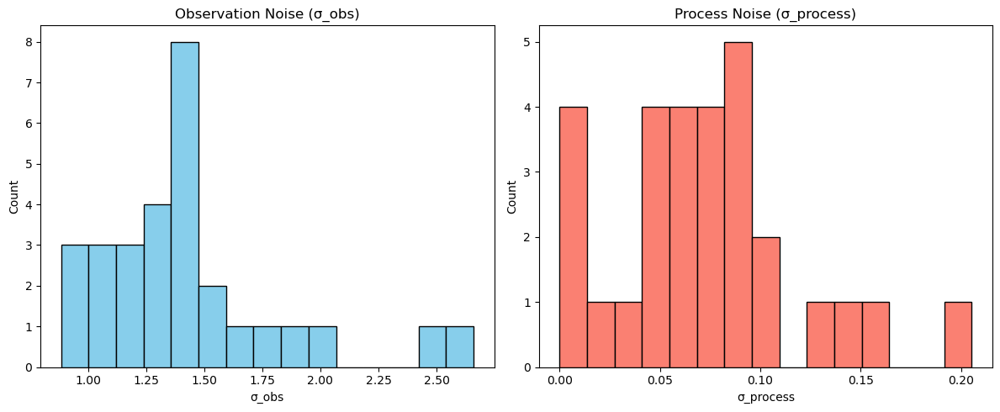

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.structural import UnobservedComponents
from tqdm import tqdm

# Load and prep
data = pd.read_csv("master_df.csv")
data['startDate'] = pd.to_datetime(data['startDate'])
data['year'] = data['startDate'].dt.year

# Combine home/away ERA
home = data[['startDate', 'homeTeam', 'homePitcher_era']].rename(
    columns={'homeTeam': 'team', 'homePitcher_era': 'pitch_era'}
)
away = data[['startDate', 'awayTeam', 'awayPitcher_era']].rename(
    columns={'awayTeam': 'team', 'awayPitcher_era': 'pitch_era'}
)

long_df = pd.concat([home, away], ignore_index=True)

# Filter to one year
df = long_df

# Sort by team and date
df = df.sort_values(['team', 'startDate'])

# Flag missing or valid entries
df['valid'] = df['pitch_era'].notna().astype(int)

# Compute consecutive valid observations
def max_consecutive_valid(group):
    streaks = group['valid'].groupby((group['valid'] != group['valid'].shift()).cumsum()).transform('count')
    return streaks[group['valid'] == 1].max()

consecutive_counts = df.groupby('team').apply(max_consecutive_valid).reset_index()
consecutive_counts.columns = ['team', 'max_consecutive_valid_era']
eligible_teams = consecutive_counts[consecutive_counts['max_consecutive_valid_era'] > 25]['team']

# Fit Kalman filters
results = []

for team in tqdm(eligible_teams, desc="Fitting Kalman models"):
    team_data = df[(df['team'] == team) & df['pitch_era'].notna()].copy()
    model = UnobservedComponents(team_data['pitch_era'], level='local level')
    try:
        fit_result = model.fit(disp=False)
        sigma_obs = np.sqrt(fit_result.params['sigma2.irregular'])
        sigma_proc = np.sqrt(fit_result.params['sigma2.level'])
        results.append({'team': team, 'sigma_obs': sigma_obs, 'sigma_process': sigma_proc})
    except Exception:
        continue

# Create DataFrame and plot histograms
results_df = pd.DataFrame(results)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].hist(results_df['sigma_obs'], bins=15, color='skyblue', edgecolor='black')
axes[0].set_title("Observation Noise (σ_obs)")
axes[0].set_xlabel("σ_obs")
axes[0].set_ylabel("Count")

axes[1].hist(results_df['sigma_process'], bins=15, color='salmon', edgecolor='black')
axes[1].set_title("Process Noise (σ_process)")
axes[1].set_xlabel("σ_process")
axes[1].set_ylabel("Count")

plt.tight_layout()
plt.show()

Sliding windows per team: 100%|██████████| 31/31 [00:02<00:00, 11.80it/s]


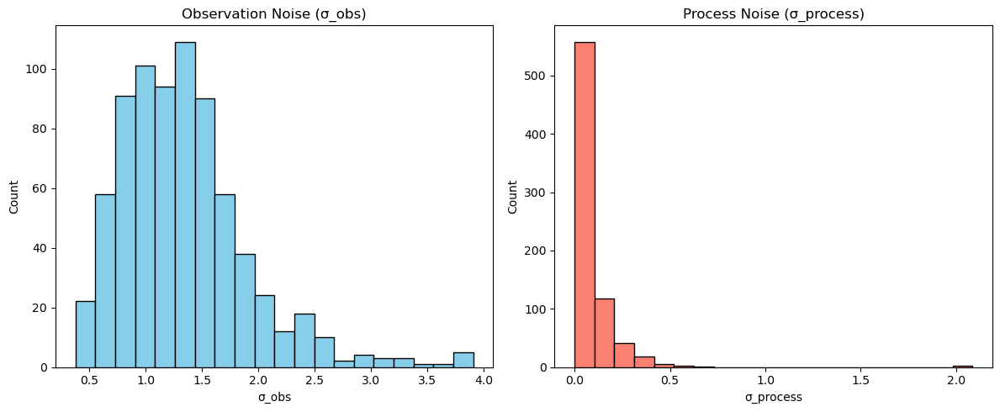

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.structural import UnobservedComponents
from tqdm import tqdm

# Load and prep
data = pd.read_csv("master_df.csv")
data['startDate'] = pd.to_datetime(data['startDate'])
data['year'] = data['startDate'].dt.year

# Combine home/away ERA
home = data[['startDate', 'homeTeam', 'homePitcher_era']].rename(
    columns={'homeTeam': 'team', 'homePitcher_era': 'pitch_era'}
)
away = data[['startDate', 'awayTeam', 'awayPitcher_era']].rename(
    columns={'awayTeam': 'team', 'awayPitcher_era': 'pitch_era'}
)
long_df = pd.concat([home, away], ignore_index=True)
long_df = long_df.dropna(subset=['pitch_era'])
long_df = long_df.sort_values(['team', 'startDate'])

# Sliding window settings
WINDOW_SIZE = 30
STEP = 5

# Results
results = []

# Loop through each team
for team, group in tqdm(long_df.groupby('team'), desc="Sliding windows per team"):
    group = group.sort_values('startDate').reset_index(drop=True)

    if len(group) < WINDOW_SIZE:
        continue

    for start in range(0, len(group) - WINDOW_SIZE + 1, STEP):
        window = group.iloc[start:start + WINDOW_SIZE]

        try:
            model = UnobservedComponents(window['pitch_era'], level='local level')
            fit_result = model.fit(disp=False)
            sigma_obs = np.sqrt(fit_result.params.get('sigma2.irregular', np.nan))
            sigma_proc = np.sqrt(fit_result.params.get('sigma2.level', np.nan))
            results.append({'team': team, 'sigma_obs': sigma_obs, 'sigma_process': sigma_proc})
        except Exception:
            continue

# Collect results
results_df = pd.DataFrame(results).dropna()

# Plot
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].hist(results_df['sigma_obs'], bins=20, color='skyblue', edgecolor='black')
axes[0].set_title("Observation Noise (σ_obs)")
axes[0].set_xlabel("σ_obs")
axes[0].set_ylabel("Count")

axes[1].hist(results_df['sigma_process'], bins=20, color='salmon', edgecolor='black')
axes[1].set_title("Process Noise (σ_process)")
axes[1].set_xlabel("σ_process")
axes[1].set_ylabel("Count")

plt.tight_layout()
plt.show()


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_81216/2344918907.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sort_values("startDate").head(10)['pitch_era'].mean())
Sliding windows per team: 100%|██████████| 31/31 [00:02<00:00, 11.29it/s]


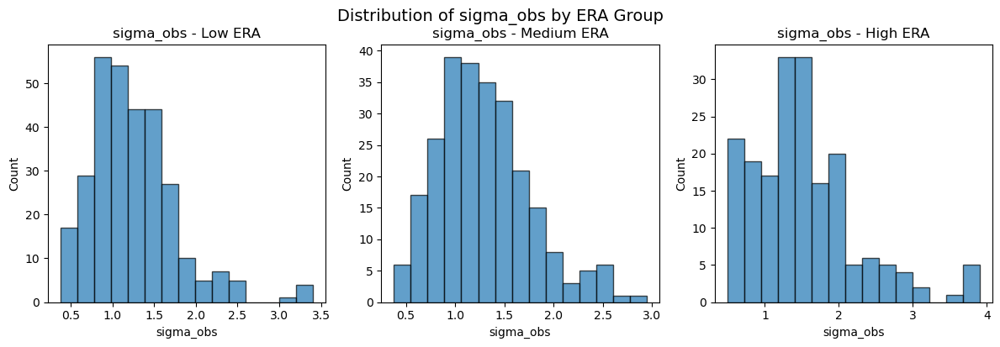

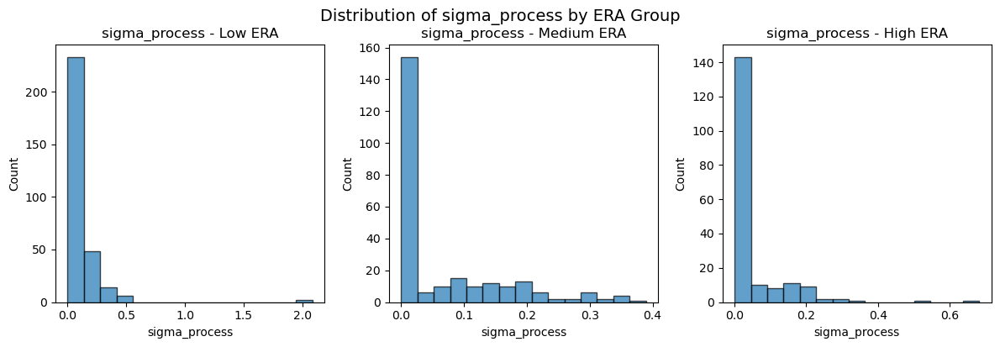

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.structural import UnobservedComponents
from tqdm import tqdm

# Load and prep
data = pd.read_csv("master_df.csv")
data['startDate'] = pd.to_datetime(data['startDate'])
data['year'] = data['startDate'].dt.year

# Combine home/away ERA
home = data[['startDate', 'homeTeam', 'homePitcher_era']].rename(
    columns={'homeTeam': 'team', 'homePitcher_era': 'pitch_era'}
)
away = data[['startDate', 'awayTeam', 'awayPitcher_era']].rename(
    columns={'awayTeam': 'team', 'awayPitcher_era': 'pitch_era'}
)
long_df = pd.concat([home, away], ignore_index=True)
long_df = long_df.dropna(subset=['pitch_era'])
long_df = long_df.sort_values(['team', 'startDate'])

# Compute average ERA over first 10 appearances per team
first_10_era = (
    long_df.groupby("team")
    .apply(lambda x: x.sort_values("startDate").head(10)['pitch_era'].mean())
    .reset_index()
    .rename(columns={0: 'avg_era_10'})
)

# Bin teams into quantiles
first_10_era['group'] = pd.qcut(first_10_era['avg_era_10'], 3, labels=['low', 'medium', 'high'])

# Map group labels to long_df
long_df = long_df.merge(first_10_era[['team', 'group']], on='team', how='left')

# Sliding window settings
WINDOW_SIZE = 30
STEP = 5

# Results
results = []

# Loop through each team
for team, group_df in tqdm(long_df.groupby('team'), desc="Sliding windows per team"):
    group_df = group_df.sort_values('startDate').reset_index(drop=True)
    group_label = group_df['group'].iloc[0]

    if len(group_df) < WINDOW_SIZE or pd.isna(group_label):
        continue

    for start in range(0, len(group_df) - WINDOW_SIZE + 1, STEP):
        window = group_df.iloc[start:start + WINDOW_SIZE]

        try:
            model = UnobservedComponents(window['pitch_era'], level='local level')
            fit_result = model.fit(disp=False)
            sigma_obs = np.sqrt(fit_result.params.get('sigma2.irregular', np.nan))
            sigma_proc = np.sqrt(fit_result.params.get('sigma2.level', np.nan))
            results.append({
                'team': team,
                'group': group_label,
                'sigma_obs': sigma_obs,
                'sigma_process': sigma_proc
            })
        except Exception:
            continue

# Results to DataFrame
results_df = pd.DataFrame(results).dropna()

# Plot histograms for each group
for var in ['sigma_obs', 'sigma_process']:
    plt.figure(figsize=(12, 4))
    for i, grp in enumerate(['low', 'medium', 'high']):
        subset = results_df[results_df['group'] == grp]
        plt.subplot(1, 3, i + 1)
        plt.hist(subset[var], bins=15, edgecolor='black', alpha=0.7)
        plt.title(f'{var} - {grp.capitalize()} ERA')
        plt.xlabel(var)
        plt.ylabel("Count")
    plt.tight_layout()
    plt.suptitle(f"Distribution of {var} by ERA Group", y=1.02, fontsize=14)
    plt.show()


/var/folders/hn/7wzd6_fs6wncrcy89b9jdj100000gn/T/ipykernel_81216/4255557876.py:25: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sort_values("startDate").head(10)['pitch_era'].mean())
Processing ERA bins:   0%|          | 0/31 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.12/s

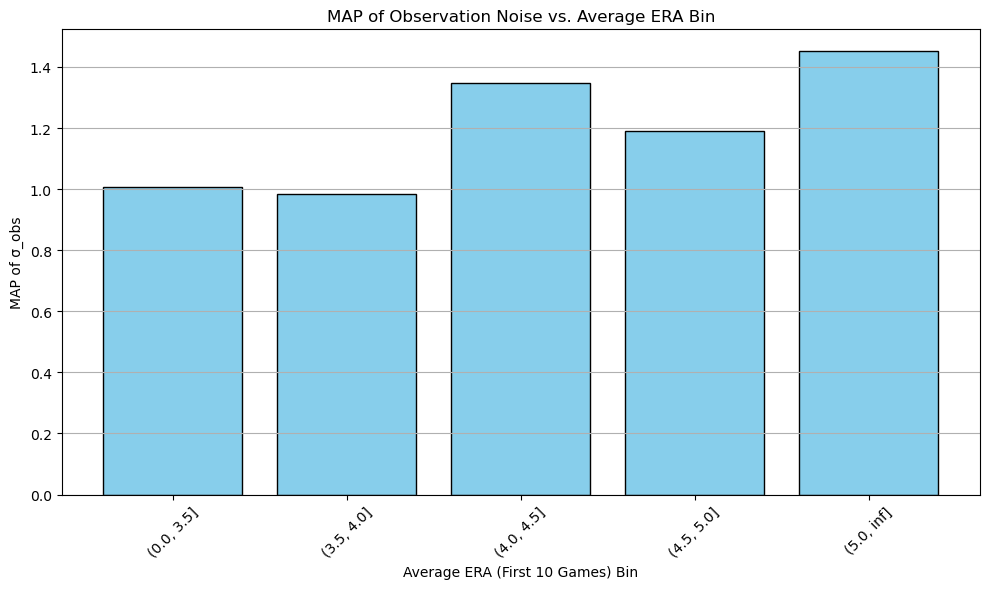

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.structural import UnobservedComponents
from tqdm import tqdm

# Load and prep
data = pd.read_csv("master_df.csv")
data['startDate'] = pd.to_datetime(data['startDate'])
data['year'] = data['startDate'].dt.year

# Combine home/away ERA
home = data[['startDate', 'homeTeam', 'homePitcher_era']].rename(
    columns={'homeTeam': 'team', 'homePitcher_era': 'pitch_era'}
)
away = data[['startDate', 'awayTeam', 'awayPitcher_era']].rename(
    columns={'awayTeam': 'team', 'awayPitcher_era': 'pitch_era'}
)
long_df = pd.concat([home, away], ignore_index=True).dropna()
long_df = long_df.sort_values(['team', 'startDate'])

# STEP 1: Compute average ERA in first 10 games per team
era_bins = (
    long_df.groupby("team")
    .apply(lambda x: x.sort_values("startDate").head(10)['pitch_era'].mean())
    .reset_index()
    .rename(columns={0: 'avg_era_10'})
)

# STEP 2: Bin avg_era_10 into quantile groups or custom bins
era_bins['era_bin'] = pd.cut(era_bins['avg_era_10'], bins=[0, 3.5, 4.0, 4.5, 5.0, np.inf])

# STEP 3: Run Kalman filters in sliding windows and group by bin
WINDOW_SIZE = 30
STEP = 5

results = []

for _, row in tqdm(era_bins.iterrows(), total=len(era_bins), desc="Processing ERA bins"):
    team = row['team']
    bin_label = row['era_bin']

    team_data = long_df[(long_df['team'] == team)].copy()
    if len(team_data) < WINDOW_SIZE:
        continue

    for start in range(0, len(team_data) - WINDOW_SIZE + 1, STEP):
        window = team_data.iloc[start:start + WINDOW_SIZE]
        try:
            model = UnobservedComponents(window['pitch_era'], level='local level')
            fit_result = model.fit(disp=False)
            sigma_obs = np.sqrt(fit_result.params.get('sigma2.irregular', np.nan))
            results.append({'era_bin': bin_label, 'sigma_obs': sigma_obs})
        except Exception:
            continue

# STEP 4: Aggregate by bin to get MAP of sigma_obs
def compute_map(series):
    hist, bin_edges = np.histogram(series, bins=20)
    return bin_edges[np.argmax(hist)]

results_df = pd.DataFrame(results).dropna()
map_by_bin = results_df.groupby('era_bin')['sigma_obs'].apply(compute_map).reset_index()

# STEP 5: Plot
plt.figure(figsize=(10, 6))
plt.bar(map_by_bin['era_bin'].astype(str), map_by_bin['sigma_obs'], color='skyblue', edgecolor='black')
plt.xlabel("Average ERA (First 10 Games) Bin")
plt.ylabel("MAP of σ_obs")
plt.title("MAP of Observation Noise vs. Average ERA Bin")
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


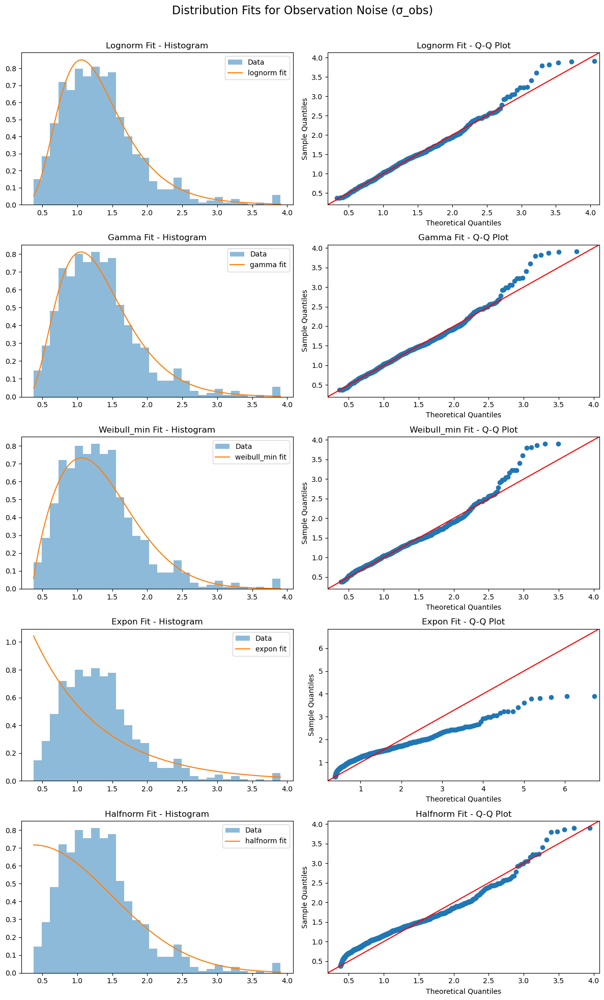

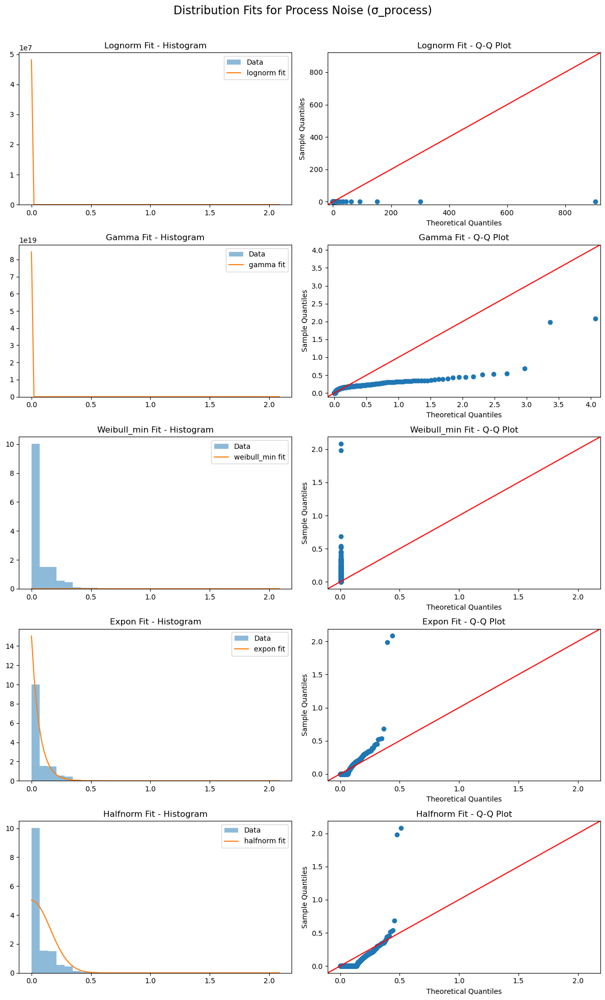

In [4]:
import scipy.stats as stats
from statsmodels.graphics.gofplots import qqplot

# Helper to fit and plot distribution comparisons
def fit_and_plot(data, dist_name, ax_hist, ax_qq, bins=30):
    dist = getattr(stats, dist_name)
    params = dist.fit(data)
    
    # Histogram with PDF
    x = np.linspace(min(data), max(data), 100)
    pdf = dist.pdf(x, *params)
    ax_hist.hist(data, bins=bins, density=True, alpha=0.5, label='Data')
    ax_hist.plot(x, pdf, label=f'{dist_name} fit')
    ax_hist.set_title(f"{dist_name.capitalize()} Fit - Histogram")
    ax_hist.legend()
    
    # QQ plot
    qqplot(data, dist(*params), line='45', ax=ax_qq)
    ax_qq.set_title(f"{dist_name.capitalize()} Fit - Q-Q Plot")

# Select columns
obs_data = results_df['sigma_obs'].dropna()
proc_data = results_df['sigma_process'].dropna()

# Define distributions to test
candidate_distributions = ['lognorm', 'gamma', 'weibull_min', 'expon', 'halfnorm']

# Plot fits
for target_data, name in [(obs_data, 'Observation Noise (σ_obs)'), (proc_data, 'Process Noise (σ_process)')]:
    fig, axes = plt.subplots(len(candidate_distributions), 2, figsize=(12, 4 * len(candidate_distributions)))
    fig.suptitle(f"Distribution Fits for {name}", fontsize=16)
    
    for i, dist_name in enumerate(candidate_distributions):
        fit_and_plot(target_data, dist_name, axes[i, 0], axes[i, 1])
    
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()
